In [ ]:
import numpy as np # for mathematical caluclations
import pandas as pd
from datetime import datetime # to access datetime

# for data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px # for interactive plotting
import plotly.graph_objects as go # for interactive plotting

# clustering
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn import cluster
from mpl_toolkits.mplot3d import axes3d

# set the plot style in matplotlib to ggplot and the firgure size to 15x5## Augmented Dickey Fuller Test for Assessing Stati
plt.style.use('ggplot')
plt.rcParams["figure.figsize"] = (15,5)

# warnings
import warnings
from warnings import filterwarnings
filterwarnings('ignore')

# Explorative Data Analysis

In [ ]:
spotify = pd.read_csv('spotify.csv',index_col = 'Unnamed: 0')
spotify.head()

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [ ]:
spotify.describe()

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,114000.000000,1.140000e+05,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000
mean,33.238535,2.280292e+05,0.566800,0.641383,5.309140,-8.258960,0.637553,0.084652,0.314910,0.156050,0.213553,0.474068,122.147837,3.904035
std,22.305078,1.072977e+05,0.173542,0.251529,3.559987,5.029337,0.480709,0.105732,0.332523,0.309555,0.190378,0.259261,29.978197,0.432621
min,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,17.000000,1.740660e+05,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218750,4.000000
50%,35.000000,2.129060e+05,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000
75%,50.000000,2.615060e+05,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.598000,0.049000,0.273000,0.683000,140.071000,4.000000
max,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000


In [ ]:
spotify.info()

<class 'pandas.core.frame.DataFrame'>
Index: 114000 entries, 0 to 113999
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   track_id          114000 non-null  object 
 1   artists           113999 non-null  object 
 2   album_name        113999 non-null  object 
 3   track_name        113999 non-null  object 
 4   popularity        114000 non-null  int64  
 5   duration_ms       114000 non-null  int64  
 6   explicit          114000 non-null  bool   
 7   danceability      114000 non-null  float64
 8   energy            114000 non-null  float64
 9   key               114000 non-null  int64  
 10  loudness          114000 non-null  float64
 11  mode              114000 non-null  int64  
 12  speechiness       114000 non-null  float64
 13  acousticness      114000 non-null  float64
 14  instrumentalness  114000 non-null  float64
 15  liveness          114000 non-null  float64
 16  valence           114000 

In [ ]:
null_values = spotify[spotify['artists'].isnull()]
null_values

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
65900,1kR4gIb7nGxHPI3D2ifs59,NaN,NaN,NaN,0,0,False,0.501,0.583,7,-9.46,0,0.0605,0.69,0.00396,0.0747,0.734,138.391,4,k-pop


The null value is off track_id, artists, album_name and track_name, which do not affect the usage of song attribute columns. Therefore we do not drop this row

## Cleaning

In [ ]:
#only include songs where speechiness below 0.66 (remove speeches, podcasts etc)
spotify = spotify[spotify['speechiness'] <= 0.66]
spotify.shape

(113120, 20)

In [ ]:
# change explicit to boolean
spotify['explicit'] = spotify['explicit'].astype(int)

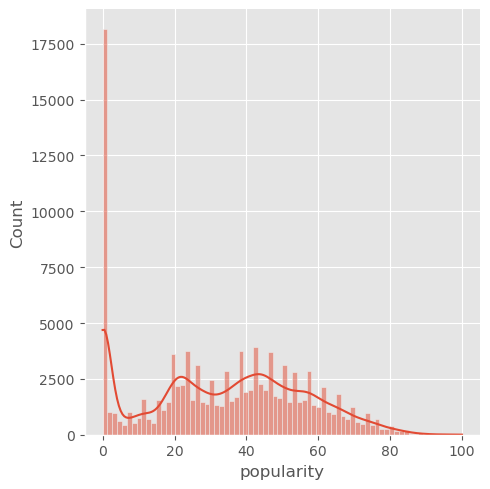

In [ ]:
sns.displot(spotify.popularity, kde = True)

## Understanding popularity by genre

In [ ]:
#sorting by mean popularity
spotify.groupby(['track_genre'])['popularity'].aggregate(['mean','median'])\
    .sort_values(by = 'mean',ascending = False).head(5)

,mean,median
track_genre,,
pop-film,59.283000,60.0
k-pop,56.886774,60.0
chill,53.673695,57.0
sad,52.368104,54.0
grunge,49.594000,55.0


In [ ]:
#sorting by median popularity
spotify.groupby(['track_genre'])['popularity'].aggregate(['mean','median'])\
    .sort_values(by = 'median',ascending = False).head(5)

,mean,median
track_genre,,
pop,47.576000,66.0
pop-film,59.283000,60.0
k-pop,56.886774,60.0
hip-hop,37.759000,58.0
chill,53.673695,57.0


<Axes: xlabel='track_genre', ylabel='popularity'>

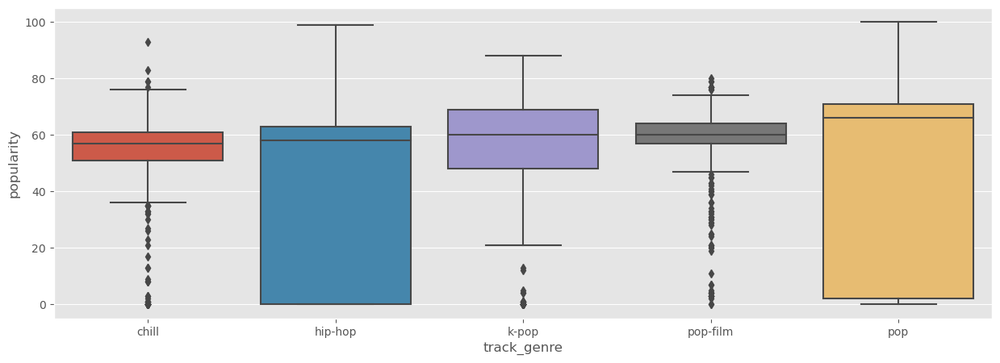

In [ ]:
#box-plot for top genres
desired_genre = ['pop-film','k-pop','chill','pop','hip-hop']
top_genre = spotify[spotify['track_genre'].isin(desired_genre)]
sns.boxplot(data = top_genre, x = 'track_genre', y = 'popularity')

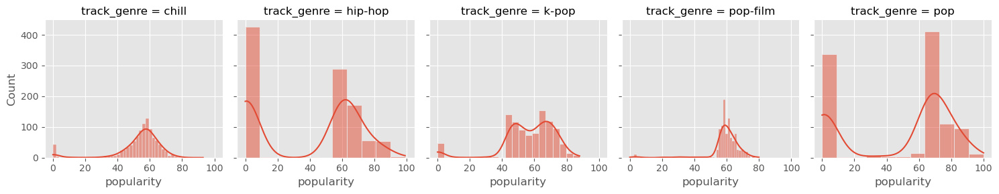

In [ ]:
#facet grid
g = sns.FacetGrid(top_genre,col='track_genre')
g.map(sns.histplot, 'popularity',kde=True)

- Chill, k-pop and pop-film genres are pretty normally distributed -> safe choice to invest in.
- Hip-hop and pop have higher risks -> higher return -> either like it or not like it

<Axes: >

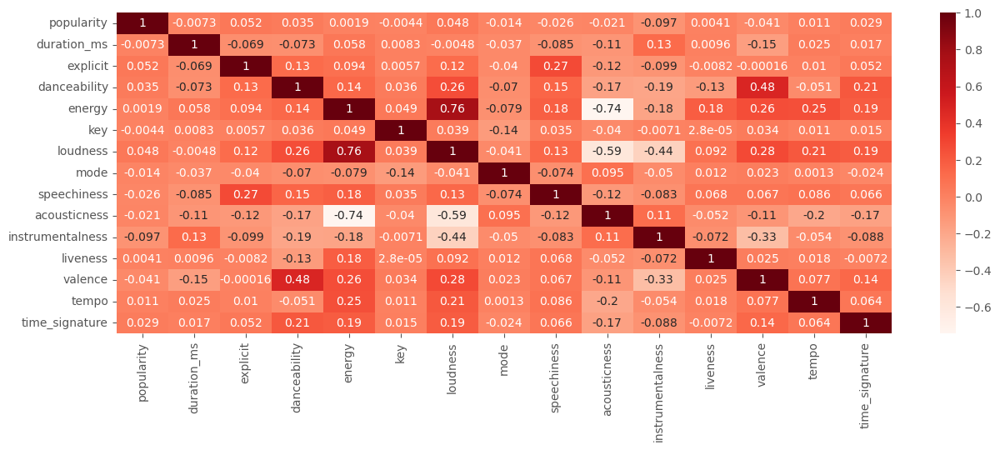

In [ ]:
#heatmap
cor_matrix = spotify.corr(numeric_only=True)
sns.heatmap(cor_matrix, annot = True, cmap = 'Reds')

## Data split to genre

In [ ]:
top_genre

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
15000,47isJpIIO8m7BJEhiFhnaf,dhruv,double take,double take,75,171743,0,0.456,0.437,8,-11.156,1,0.0867,0.839,0.000000,0.2180,0.2090,108.678,4,chill
15001,5e2l2ZAMwHmrkdM4Z6NhAR,Shiloh Dynasty;Timmies,Vivid Pictures,Again,74,157205,0,0.603,0.204,7,-12.727,0,0.1120,0.479,0.071400,0.6420,0.7100,74.688,5,chill
15002,3XV5r1cMB2AlD2ir0v6mfm,yaeow;Neptune,The Way I Love You,The Way I Love You,60,162726,0,0.543,0.206,6,-18.037,1,0.0319,0.940,0.453000,0.3850,0.1300,113.107,3,chill
15003,5HsSsEeP3hU9QSfHZrzbtA,Finding Hope,Our Love,3:00 AM,68,201951,0,0.550,0.147,0,-18.675,0,0.0404,0.563,0.001020,0.2860,0.0346,81.991,4,chill
15004,22I3h5AOENlH4CqXJsEbFR,Justine Skye;Tyga,Collide (feat. Tyga),Collide (feat. Tyga),75,260169,1,0.418,0.310,11,-9.869,0,0.0625,0.095,0.000000,0.2160,0.1310,139.614,4,chill
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81995,6mmGbsCqf5e8vxv1WodYIG,G. V. Prakash,Aadukalam (Original Motion Picture Soundtrack),Yathe Yathe,64,344360,0,0.448,0.607,9,-4.606,0,0.0611,0.791,0.000000,0.0888,0.4840,139.509,4,pop
81996,2WO5nzB7QtKn9ZRc9Jkalt,Harris Jayaraj;Sudha Ragunathan,Vaaranam Aayiram (Original Motion Picture Soun...,Annul Maelae,64,322506,0,0.773,0.436,4,-10.972,0,0.0321,0.672,0.006780,0.1970,0.5330,115.917,4,pop
81997,5OCFWPgrCCNBukB3YrDD90,Raj Barman,Tu Mile Dil Khile - Raj Barman,Tu Mile Dil Khile,62,197716,0,0.639,0.368,2,-14.096,0,0.0480,0.245,0.000000,0.1060,0.4150,89.940,4,pop
81998,13wIQbwSuQ4YFvDvtQgSVc,Harris Jayaraj;Unnikrishnan;Chinmayi;Mega,Aadhavan (Original Motion Picture Soundtrack),Vaarayo Vaarayo,64,316680,0,0.718,0.361,5,-9.740,0,0.0298,0.565,0.119000,0.1510,0.4460,103.000,4,pop


In [ ]:
needed_col_with_genre = ['track_genre', 'popularity', 'explicit', 'danceability', 'tempo', 'instrumentalness', 'loudness', 'valence']
needed_col_without_genre = ['popularity', 'explicit', 'danceability', 'tempo', 'instrumentalness', 'loudness', 'valence']
top_genre1 = top_genre[needed_col_with_genre] # whole dataset
top_genre2 = top_genre[needed_col_without_genre] # genre clustering

In [ ]:
pop = top_genre1[top_genre1['track_genre'] == 'pop']
pop_film = top_genre1[top_genre1['track_genre'] == 'pop-film']
kpop = top_genre1[top_genre1['track_genre'] == 'k-pop']
hiphop = top_genre1[top_genre1['track_genre'] == 'hip-hop']
chill = top_genre1[top_genre1['track_genre'] == 'chill']

### Pop

In [ ]:
pop = pop.drop(columns=['track_genre'])
pop.head()

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence
81000,91,0,0.514,171.005,0.000095,-5.934,0.334
81001,74,0,0.535,191.827,0.000000,-7.862,0.373
81002,83,0,0.860,114.984,0.163000,-6.510,0.952
81003,96,1,0.733,116.992,0.000001,-5.529,0.310
81004,90,1,0.679,186.003,0.000006,-7.015,0.486


<Axes: >

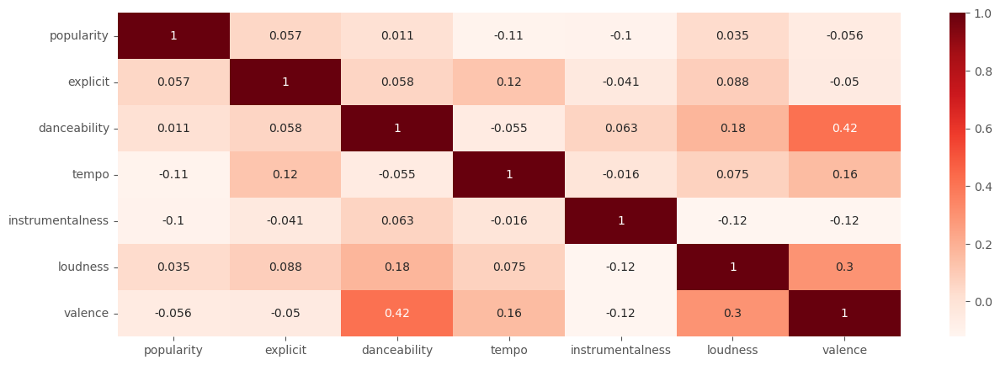

In [ ]:
#heatmap
cor_matrix_pop = pop.corr(numeric_only=True)
sns.heatmap(cor_matrix_pop, annot = True, cmap = 'Reds')

<Axes: xlabel='danceability', ylabel='popularity'>

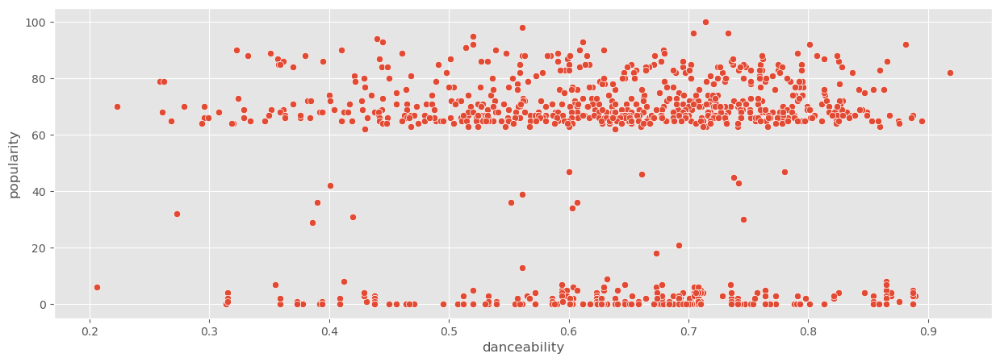

In [ ]:
sns.scatterplot(data = pop,
                    x = 'danceability',
                    y = 'popularity')

<Axes: xlabel='tempo', ylabel='popularity'>

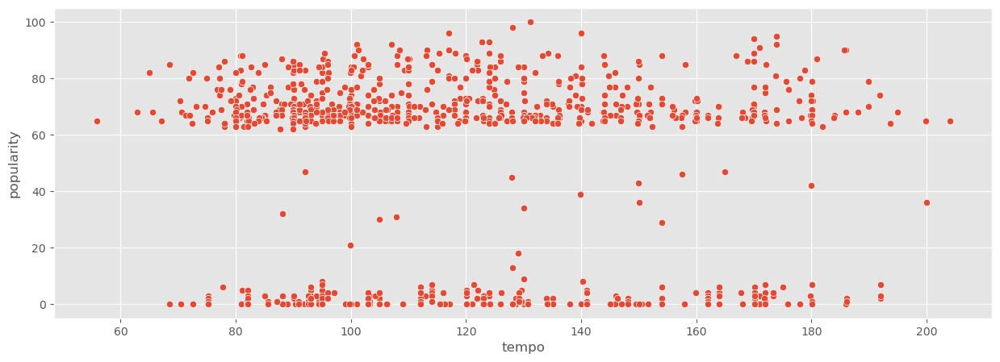

In [ ]:
sns.scatterplot(data = pop,
                    x = 'tempo',
                    y = 'popularity')

### Pop-film

In [ ]:
pop_film = pop_film.drop(columns=['track_genre'])
pop_film.head()

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence
80000,74,0,0.535,191.827,0.000000,-7.862,0.373
80001,71,0,0.481,91.796,0.000000,-8.200,0.257
80002,73,0,0.662,79.972,0.000017,-11.200,0.617
80003,71,0,0.528,94.058,0.000000,-6.250,0.317
80004,71,0,0.827,119.936,0.000000,-5.531,0.774


<Axes: >

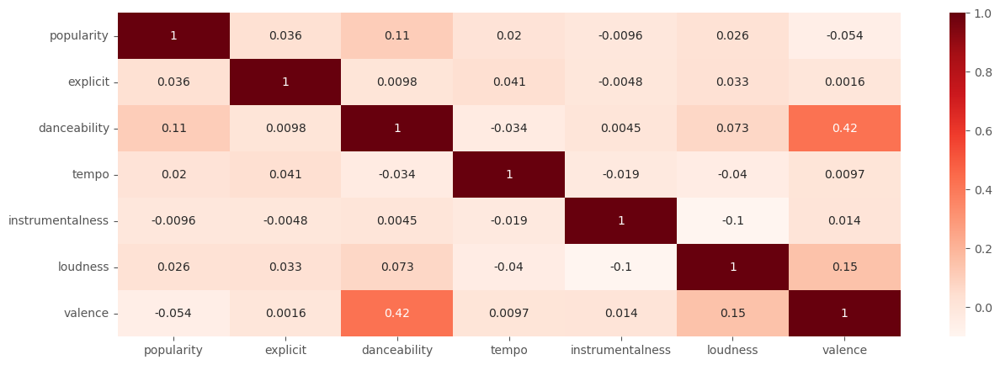

In [ ]:
#heatmap
cor_matrix_pop_film = pop_film.corr(numeric_only=True)
sns.heatmap(cor_matrix_pop_film, annot = True, cmap = 'Reds')

<Axes: xlabel='danceability', ylabel='popularity'>

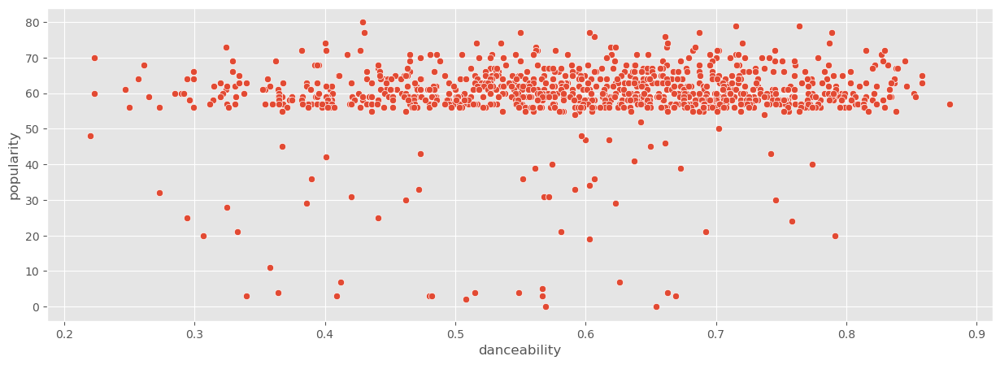

In [ ]:
sns.scatterplot(data = pop_film,
                    x = 'danceability',
                    y = 'popularity')

<Axes: xlabel='tempo', ylabel='popularity'>

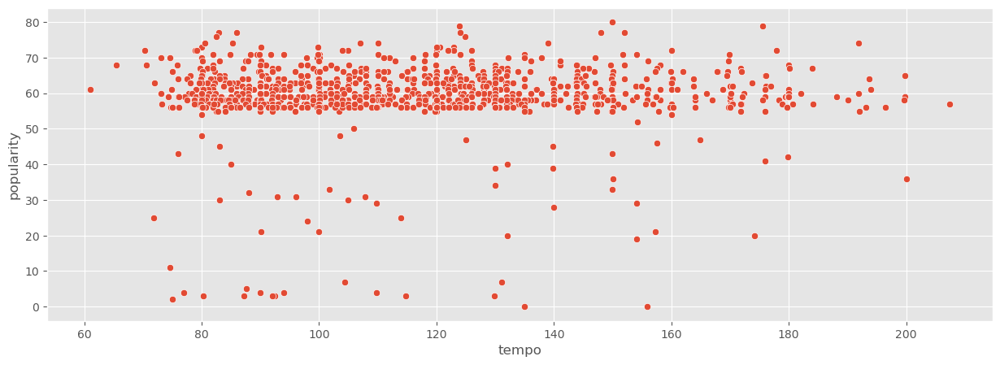

In [ ]:
sns.scatterplot(data = pop_film,
                    x = 'tempo',
                    y = 'popularity')

### Kpop

In [ ]:
kpop = kpop.drop(columns=['track_genre'])
kpop.head()

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence
65000,73,0,0.562,122.925,0.000268,-8.744,0.415
65001,78,0,0.826,140.037,0.000041,-10.121,0.400
65002,83,0,0.738,95.035,0.000000,-5.235,0.740
65003,73,0,0.752,95.043,0.000000,-5.165,0.388
65004,80,0,0.645,119.947,0.000000,-4.761,0.803


<Axes: >

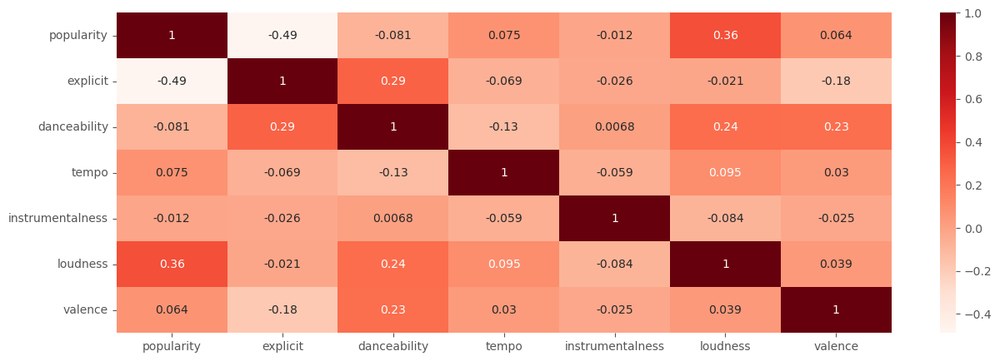

In [ ]:
#heatmap
cor_matrix_kpop = kpop.corr(numeric_only=True)
sns.heatmap(cor_matrix_kpop, annot = True, cmap = 'Reds')

<Axes: xlabel='danceability', ylabel='popularity'>

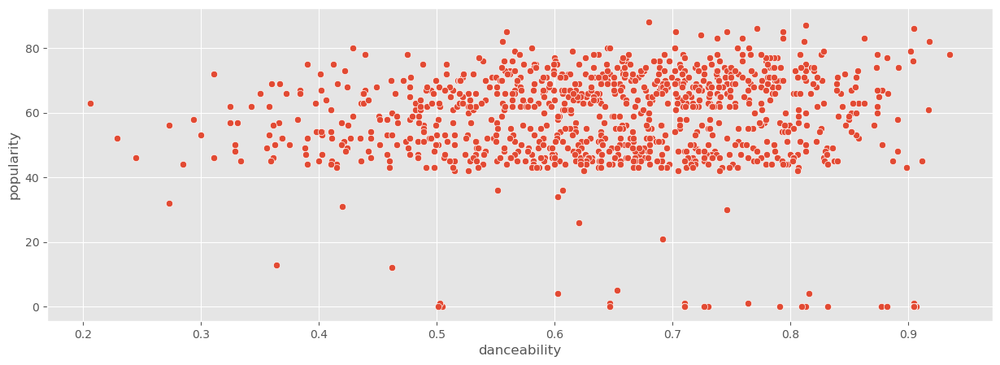

In [ ]:
sns.scatterplot(data = kpop,
                    x = 'danceability',
                    y = 'popularity')

<Axes: xlabel='tempo', ylabel='popularity'>

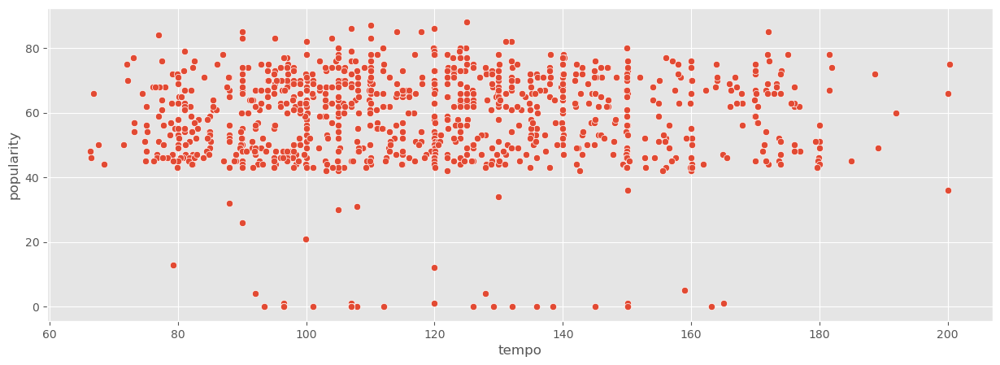

In [ ]:
sns.scatterplot(data = kpop,
                    x = 'tempo',
                    y = 'popularity')

### Hiphop

In [ ]:
hiphop = hiphop.drop(columns=['track_genre'])
hiphop.head()

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence
51000,83,0,0.860,114.984,0.163000,-6.510,0.952
51001,83,0,0.768,137.034,0.000000,-8.936,0.722
51002,82,0,0.711,180.219,0.016300,-10.048,0.674
51003,77,0,0.796,98.967,0.000025,-7.030,0.304
51004,89,1,0.591,169.928,0.000000,-5.484,0.478


<Axes: >

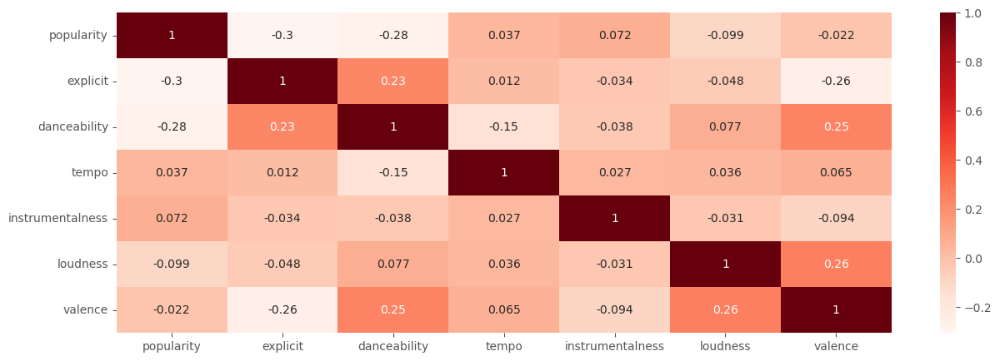

In [ ]:
#heatmap
cor_matrix_hiphop = hiphop.corr(numeric_only=True)
sns.heatmap(cor_matrix_hiphop, annot = True, cmap = 'Reds')

<Axes: xlabel='danceability', ylabel='popularity'>

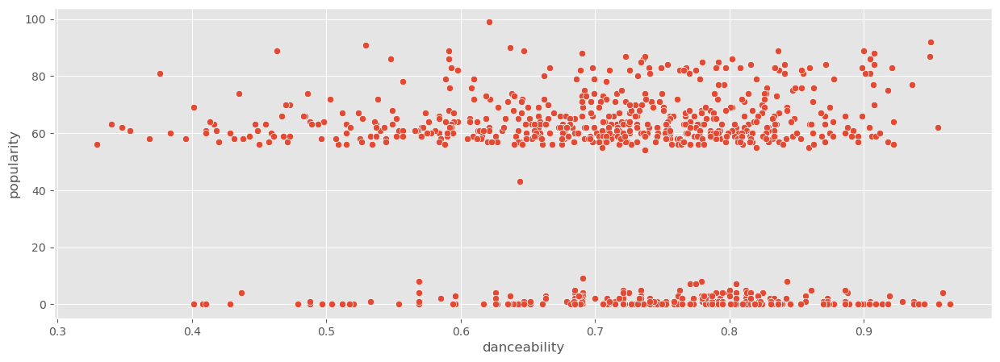

In [ ]:
sns.scatterplot(data = hiphop,
                    x = 'danceability',
                    y = 'popularity')

<Axes: xlabel='tempo', ylabel='popularity'>

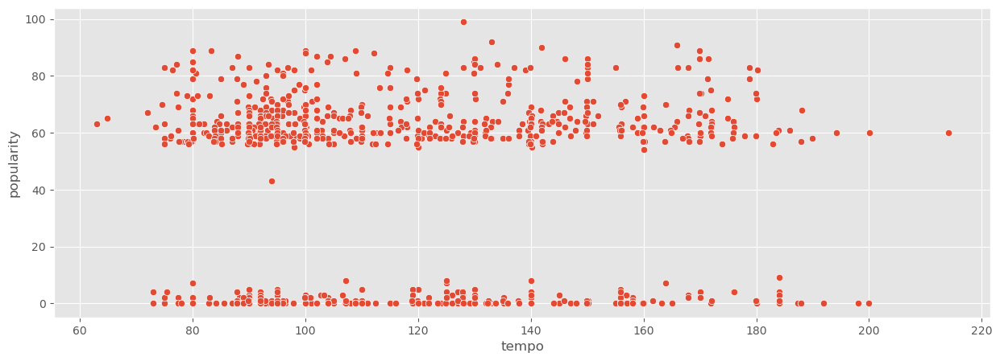

In [ ]:
sns.scatterplot(data = hiphop,
                    x = 'tempo',
                    y = 'popularity')

### Chill

In [ ]:
chill = chill.drop(columns=['track_genre'])
chill.head()

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence
15000,75,0,0.456,108.678,0.00000,-11.156,0.2090
15001,74,0,0.603,74.688,0.07140,-12.727,0.7100
15002,60,0,0.543,113.107,0.45300,-18.037,0.1300
15003,68,0,0.550,81.991,0.00102,-18.675,0.0346
15004,75,1,0.418,139.614,0.00000,-9.869,0.1310


<Axes: >

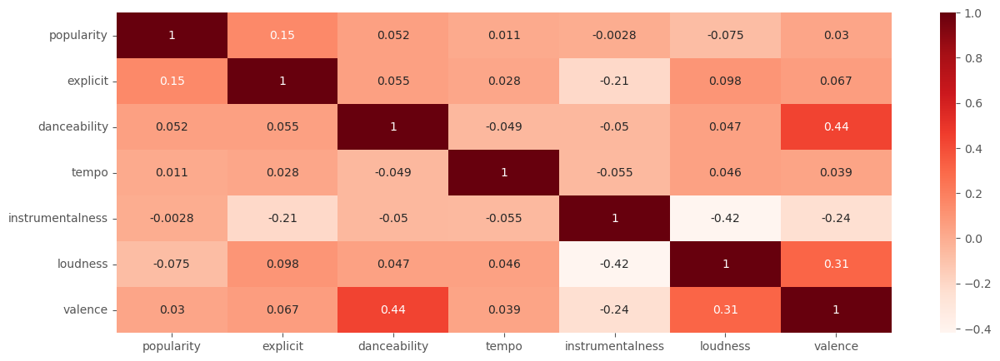

In [ ]:
#heatmap
cor_matrix_chill = chill.corr(numeric_only=True)
sns.heatmap(cor_matrix_chill, annot = True, cmap = 'Reds')

<Axes: xlabel='danceability', ylabel='popularity'>

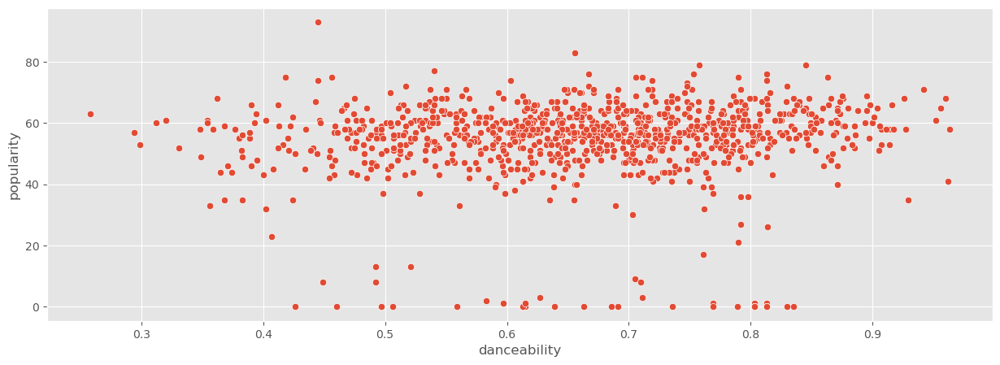

In [ ]:
sns.scatterplot(data = chill,
                    x = 'danceability',
                    y = 'popularity')

<Axes: xlabel='tempo', ylabel='popularity'>

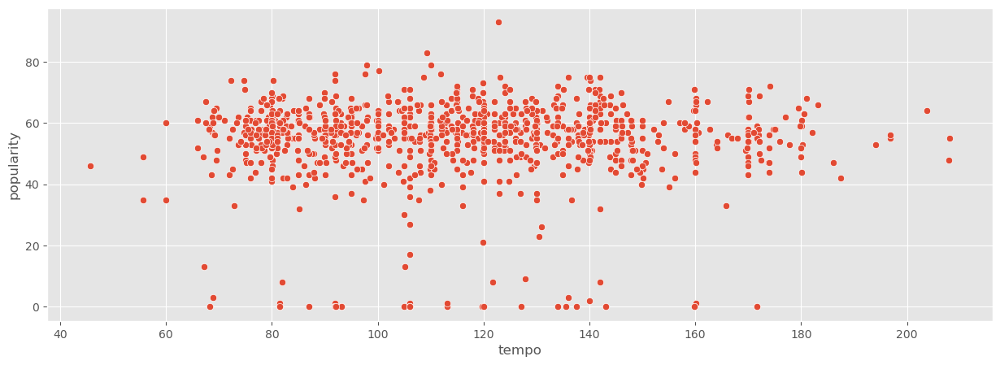

In [ ]:
sns.scatterplot(data = chill,
                    x = 'tempo',
                    y = 'popularity')

# Linear Regression - Failed

In [ ]:
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

x = kpop.drop(columns = ['popularity'])
y = kpop['popularity']
x = sm.add_constant(x)

#fit linear regression model
model = sm.OLS(y, x).fit()

#view model summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:             popularity   R-squared:                       0.363
Model:                            OLS   Adj. R-squared:                  0.360
Method:                 Least Squares   F-statistic:                     94.28
Date:                Sat, 02 Dec 2023   Prob (F-statistic):           1.09e-93
Time:                        18:42:43   Log-Likelihood:                -4015.5
No. Observations:                 998   AIC:                             8045.
Df Residuals:                     991   BIC:                             8079.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               74.8571      3.568  

# K-Means Clustering

In [ ]:
#cluster summary
def cluster_table(data, cluster):
    # Grouping by cluster
    grouped = data.groupby(cluster)

    # Adding a count of data points in each cluster
    summary_table = grouped.size().to_frame(name='Count')

    # Adding summary statistics
    summary_stats = grouped.agg({col: 'median' if np.issubdtype(data[col].dtype, np.number)
                                 else lambda x: (x == '1').sum() / len(x)
                                 for col in data.columns if col != cluster})

    # Merging the count with summary statistics
    summary_table = summary_table.join(summary_stats)

    # Formatting numeric columns
    for col in summary_table.select_dtypes(include=[np.number]).columns:
        summary_table[col] = summary_table[col].apply(lambda x: round(x, 2) if isinstance(x, float) else x)

    return summary_table

## Whole dataset

In [ ]:
top_genre1

,track_genre,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence
15000,chill,75,0,0.456,108.678,0.000000,-11.156,0.2090
15001,chill,74,0,0.603,74.688,0.071400,-12.727,0.7100
15002,chill,60,0,0.543,113.107,0.453000,-18.037,0.1300
15003,chill,68,0,0.550,81.991,0.001020,-18.675,0.0346
15004,chill,75,1,0.418,139.614,0.000000,-9.869,0.1310
...,...,...,...,...,...,...,...,...
81995,pop,64,0,0.448,139.509,0.000000,-4.606,0.4840
81996,pop,64,0,0.773,115.917,0.006780,-10.972,0.5330
81997,pop,62,0,0.639,89.940,0.000000,-14.096,0.4150
81998,pop,64,0,0.718,103.000,0.119000,-9.740,0.4460


In [ ]:
model_0 = top_genre1
model_0 = pd.get_dummies(top_genre1, columns=['track_genre'])
model_0

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence,track_genre_chill,track_genre_hip-hop,track_genre_k-pop,track_genre_pop,track_genre_pop-film
15000,75,0,0.456,108.678,0.000000,-11.156,0.2090,True,False,False,False,False
15001,74,0,0.603,74.688,0.071400,-12.727,0.7100,True,False,False,False,False
15002,60,0,0.543,113.107,0.453000,-18.037,0.1300,True,False,False,False,False
15003,68,0,0.550,81.991,0.001020,-18.675,0.0346,True,False,False,False,False
15004,75,1,0.418,139.614,0.000000,-9.869,0.1310,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
81995,64,0,0.448,139.509,0.000000,-4.606,0.4840,False,False,False,True,False
81996,64,0,0.773,115.917,0.006780,-10.972,0.5330,False,False,False,True,False
81997,62,0,0.639,89.940,0.000000,-14.096,0.4150,False,False,False,True,False
81998,64,0,0.718,103.000,0.119000,-9.740,0.4460,False,False,False,True,False


In [ ]:
X = model_0
scaler = StandardScaler().fit(X)
X_scaled = pd.DataFrame(scaler.fit_transform(X),columns=X.columns,index=X.index)

X_scaled

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence,track_genre_chill,track_genre_hip-hop,track_genre_k-pop,track_genre_pop,track_genre_pop-film
15000,0.958143,-0.373714,-1.429441,-0.318475,-0.253963,-1.073570,-1.361175,2.003511,-0.500375,-0.49975,-0.500375,-0.500375
15001,0.918169,-0.373714,-0.374350,-1.487799,0.167033,-1.540361,0.908569,2.003511,-0.500375,-0.49975,-0.500375,-0.500375
15002,0.358523,-0.373714,-0.804999,-0.166109,2.417061,-3.118122,-1.719078,2.003511,-0.500375,-0.49975,-0.500375,-0.500375
15003,0.678321,-0.373714,-0.754757,-1.236561,-0.247949,-3.307691,-2.151281,2.003511,-0.500375,-0.49975,-0.500375,-0.500375
15004,0.958143,2.675842,-1.702185,0.745785,-0.253963,-0.691163,-1.714548,2.003511,-0.500375,-0.49975,-0.500375,-0.500375
...,...,...,...,...,...,...,...,...,...,...,...,...
81995,0.518422,-0.373714,-1.486861,0.742172,-0.253963,0.872633,-0.115308,-0.499124,-0.500375,-0.49975,1.998499,-0.500375
81996,0.518422,-0.373714,0.845822,-0.069439,-0.213986,-1.018898,0.106683,-0.499124,-0.500375,-0.49975,1.998499,-0.500375
81997,0.438473,-0.373714,-0.115961,-0.963100,-0.253963,-1.947132,-0.427907,-0.499124,-0.500375,-0.49975,1.998499,-0.500375
81998,0.518422,-0.373714,0.451061,-0.513810,0.447696,-0.652834,-0.287464,-0.499124,-0.500375,-0.49975,1.998499,-0.500375


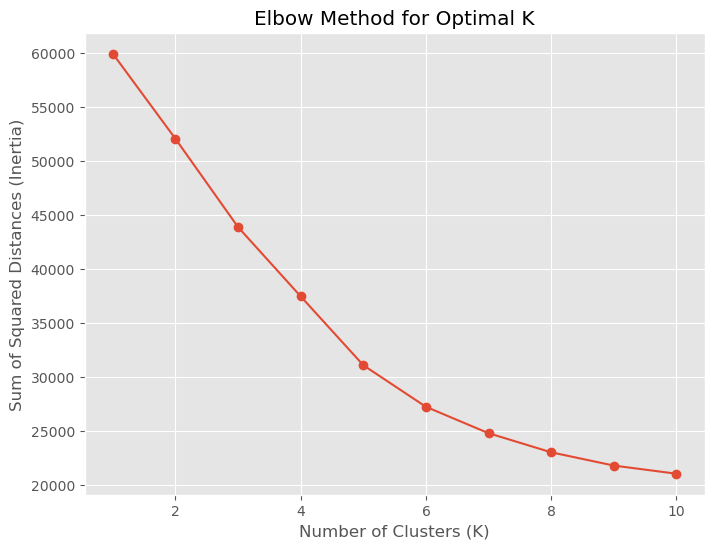

In [ ]:
# Run k-means clustering for a range of k values
inertia = []
for k in range(1, 11):  # You can adjust the range based on your specific needs
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Plot the elbow graph
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Distances (Inertia)')
plt.grid(True)
plt.show()

In [ ]:
#choose k = 5
model = cluster.KMeans(n_clusters = 5, random_state = 10, n_init=10)

#fit the created k-means model to our data
model.fit(X_scaled)

X_scaled['cluster'] = model.labels_
X_scaled

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence,track_genre_chill,track_genre_hip-hop,track_genre_k-pop,track_genre_pop,track_genre_pop-film,cluster
15000,0.958143,-0.373714,-1.429441,-0.318475,-0.253963,-1.073570,-1.361175,2.003511,-0.500375,-0.49975,-0.500375,-0.500375,3
15001,0.918169,-0.373714,-0.374350,-1.487799,0.167033,-1.540361,0.908569,2.003511,-0.500375,-0.49975,-0.500375,-0.500375,3
15002,0.358523,-0.373714,-0.804999,-0.166109,2.417061,-3.118122,-1.719078,2.003511,-0.500375,-0.49975,-0.500375,-0.500375,3
15003,0.678321,-0.373714,-0.754757,-1.236561,-0.247949,-3.307691,-2.151281,2.003511,-0.500375,-0.49975,-0.500375,-0.500375,3
15004,0.958143,2.675842,-1.702185,0.745785,-0.253963,-0.691163,-1.714548,2.003511,-0.500375,-0.49975,-0.500375,-0.500375,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
81995,0.518422,-0.373714,-1.486861,0.742172,-0.253963,0.872633,-0.115308,-0.499124,-0.500375,-0.49975,1.998499,-0.500375,2
81996,0.518422,-0.373714,0.845822,-0.069439,-0.213986,-1.018898,0.106683,-0.499124,-0.500375,-0.49975,1.998499,-0.500375,2
81997,0.438473,-0.373714,-0.115961,-0.963100,-0.253963,-1.947132,-0.427907,-0.499124,-0.500375,-0.49975,1.998499,-0.500375,2
81998,0.518422,-0.373714,0.451061,-0.513810,0.447696,-0.652834,-0.287464,-0.499124,-0.500375,-0.49975,1.998499,-0.500375,2


In [ ]:
# Generating the cluster summary
cluster_summary = cluster_table(X_scaled, 'cluster')

# Printing the summary table
print(cluster_summary)

         Count  popularity  explicit  danceability  tempo  instrumentalness  \
cluster                                                                       
0         1000        0.36     -0.37         -0.35  -0.10             -0.25   
1          997        0.36     -0.37          0.01  -0.04             -0.25   
2         1000        0.60     -0.37         -0.09   0.02             -0.25   
3          998        0.24     -0.37          0.13  -0.11             -0.25   
4          999        0.28     -0.37          0.70  -0.37             -0.25   

         loudness  valence  track_genre_chill  track_genre_hip-hop  \
cluster                                                              
0           -0.01     0.12               -0.5                 -0.5   
1            0.42     0.27               -0.5                 -0.5   
2            0.24    -0.05               -0.5                 -0.5   
3           -0.67    -0.63                2.0                 -0.5   
4            0.49     0.18

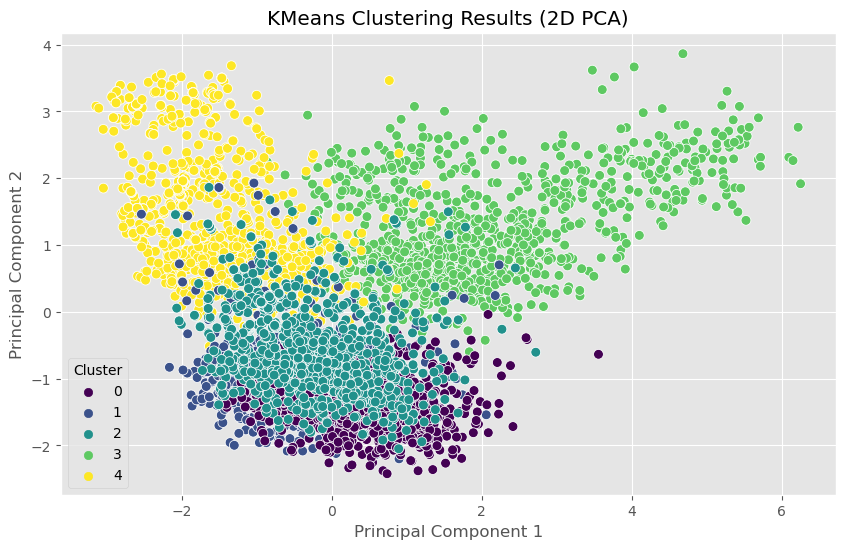

In [ ]:
#pca = 2
pca = PCA(n_components = 2) # 2D graph for easy interpretation
X_pca = pca.fit_transform(X_scaled.drop('cluster', axis=1))

# Create a scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=X_scaled['cluster'], palette='viridis', s=50)
plt.title('KMeans Clustering Results (2D PCA)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

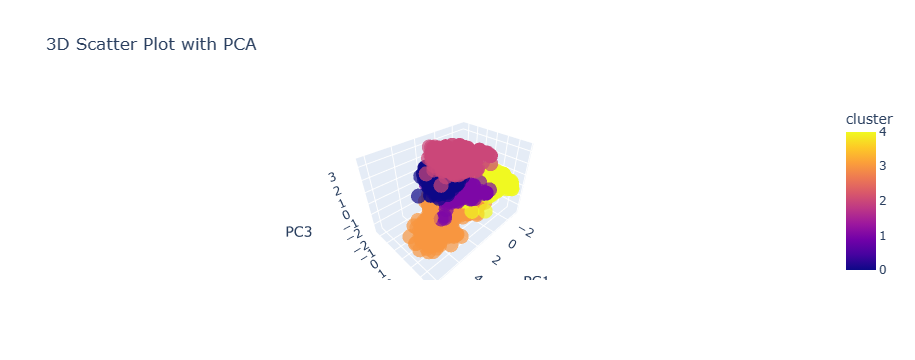

In [ ]:
# PCA = 3
pca = PCA(n_components = 3)
X_pca = pca.fit_transform(X_scaled.drop('cluster', axis=1))
pca_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
pca_df['cluster'] = X_scaled['cluster'].reset_index(drop=True)

# Create a 3D scatter plot using Plotly Express
fig = px.scatter_3d(
    pca_df, x='PC1', y='PC2', z='PC3',
    color='cluster',
    #symbol='cluster',
    opacity=0.7,
    title='3D Scatter Plot with PCA'
)

# Show the plot
fig.show()

## Pop

In [ ]:
Y = pop
scaler = StandardScaler().fit(Y)
Y_scaled = pd.DataFrame(scaler.fit_transform(Y),columns=Y.columns,index=Y.index)

Y_scaled

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence
81000,1.276297,-0.282690,-0.851103,1.612770,-0.148587,0.398218,-0.811978
81001,0.776641,-0.282690,-0.697607,2.283347,-0.150174,-0.354515,-0.628105
81002,1.041165,-0.282690,1.677917,-0.191398,2.561715,0.173335,2.101705
81003,1.423254,3.537444,0.749635,-0.126730,-0.150154,0.556338,-0.925130
81004,1.246905,3.537444,0.354932,2.095784,-0.150068,-0.023828,-0.095344
...,...,...,...,...,...,...,...
81995,0.482726,-0.282690,-1.333517,0.598435,-0.150174,0.916697,-0.104773
81996,0.482726,-0.282690,1.042007,-0.161350,-0.037373,-1.568725,0.126247
81997,0.423943,-0.282690,0.062560,-0.997945,-0.150174,-2.788401,-0.430087
81998,0.482726,-0.282690,0.639995,-0.577345,1.829671,-1.087726,-0.283932


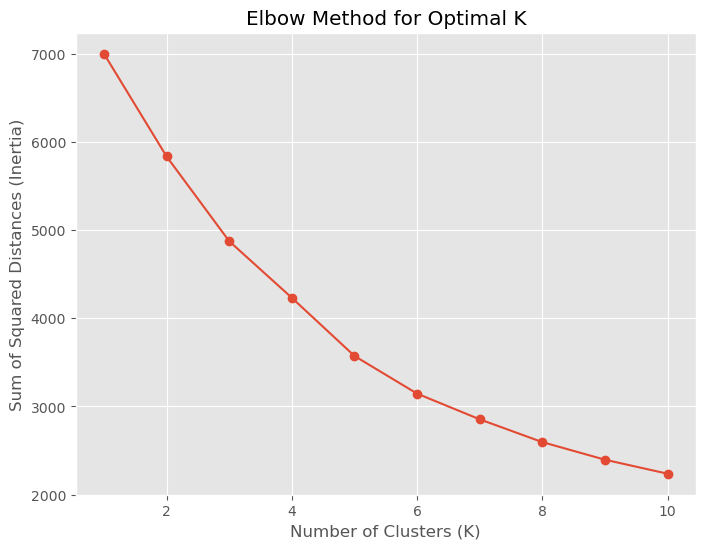

In [ ]:
# Run k-means clustering for a range of k values
inertia = []
for k in range(1, 11):  # You can adjust the range based on your specific needs
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(Y_scaled)
    inertia.append(kmeans.inertia_)

# Plot the elbow graph
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Distances (Inertia)')
plt.grid(True)
plt.show()

In [ ]:
#choose k = 5
model = cluster.KMeans(n_clusters = 5, random_state = 10, n_init=10)

#fit the created k-means model to our data
model.fit(Y_scaled)

Y_scaled['cluster'] = model.labels_
Y_scaled

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence,cluster
81000,1.276297,-0.282690,-0.851103,1.612770,-0.148587,0.398218,-0.811978,0
81001,0.776641,-0.282690,-0.697607,2.283347,-0.150174,-0.354515,-0.628105,0
81002,1.041165,-0.282690,1.677917,-0.191398,2.561715,0.173335,2.101705,2
81003,1.423254,3.537444,0.749635,-0.126730,-0.150154,0.556338,-0.925130,4
81004,1.246905,3.537444,0.354932,2.095784,-0.150068,-0.023828,-0.095344,4
...,...,...,...,...,...,...,...,...
81995,0.482726,-0.282690,-1.333517,0.598435,-0.150174,0.916697,-0.104773,0
81996,0.482726,-0.282690,1.042007,-0.161350,-0.037373,-1.568725,0.126247,2
81997,0.423943,-0.282690,0.062560,-0.997945,-0.150174,-2.788401,-0.430087,0
81998,0.482726,-0.282690,0.639995,-0.577345,1.829671,-1.087726,-0.283932,2


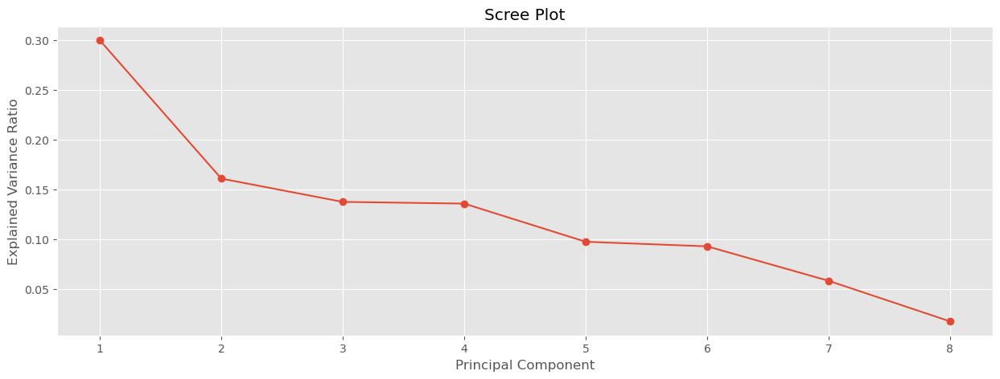

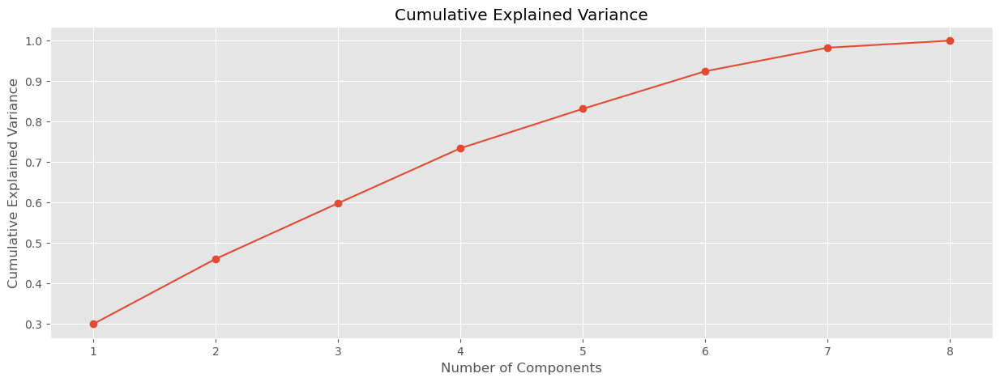

In [ ]:
#choosing PCA component
pca = PCA()
pca.fit(Y_scaled)
explained_variance_ratio = pca.explained_variance_ratio_

#scree plot
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.grid(True)
plt.show()

#culmulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

In [ ]:
# Generating the cluster summary
cluster_summary = cluster_table(Y_scaled, 'cluster')

# Printing the summary table
print(cluster_summary)

         Count  popularity  explicit  danceability  tempo  instrumentalness  \
cluster                                                                       
0          310        0.54     -0.28         -0.93  -0.36             -0.15   
1          231       -1.40     -0.28          0.39   0.23             -0.15   
2          379        0.63     -0.28          0.61  -0.35             -0.15   
3            6       -1.40     -0.28         -0.15   0.04             11.60   
4           74        0.85      3.54          0.34   0.29             -0.15   

         loudness  valence  
cluster                     
0           -0.69    -0.90  
1            0.42     0.51  
2            0.39     0.46  
3           -0.44    -1.76  
4            0.32     0.01  


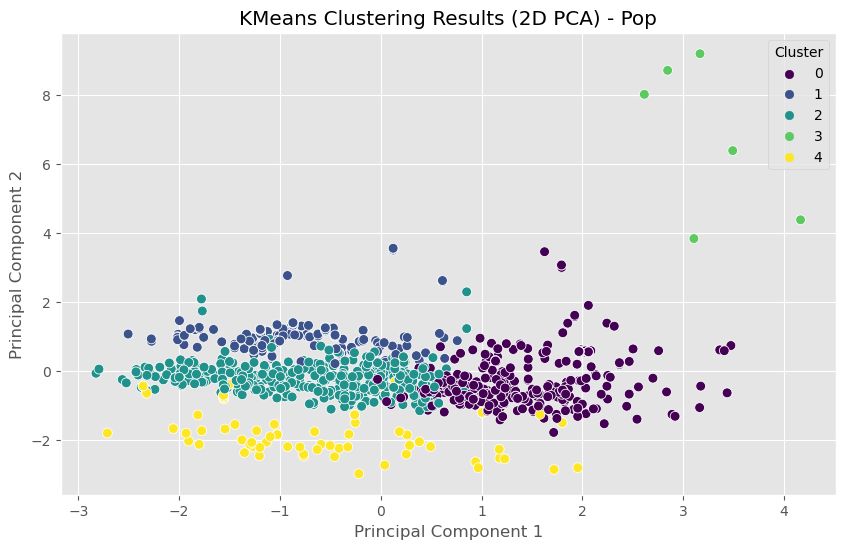

In [ ]:
#pca = 2
pca = PCA(n_components = 2) # 2D graph for easy interpretation
Y_pca = pca.fit_transform(Y_scaled.drop('cluster', axis=1))

# Create a scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=Y_pca[:, 0], y=Y_pca[:, 1], hue=Y_scaled['cluster'], palette='viridis', s=50)
plt.title('KMeans Clustering Results (2D PCA) - Pop')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

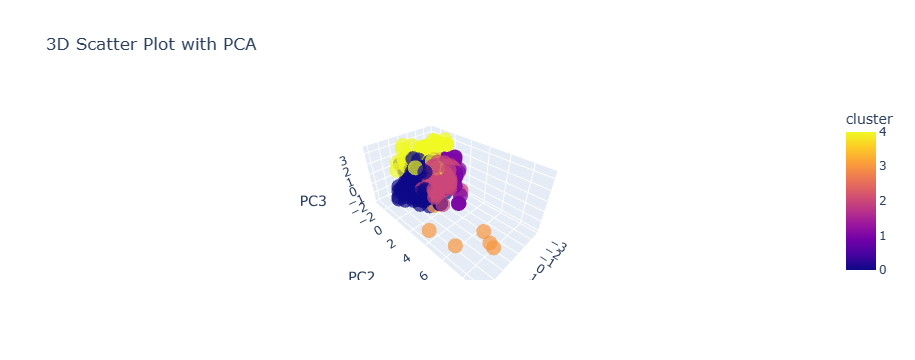

In [ ]:
# pca = 3
pca = PCA(n_components = 3)
Y_pca = pca.fit_transform(Y_scaled.drop('cluster', axis=1))
pca_df = pd.DataFrame(data = Y_pca, columns = ['PC1', 'PC2', 'PC3'])
pca_df['cluster'] = Y_scaled['cluster'].reset_index(drop=True)

# Create a 3D scatter plot using Plotly Express
fig = px.scatter_3d(
    pca_df, x='PC1', y='PC2', z='PC3',
    color='cluster',
    #symbol='cluster',
    opacity=0.7,
    title='3D Scatter Plot with PCA'
)

# Show the plot
fig.show()

## Pop-film

In [ ]:
P = pop_film
scaler = StandardScaler().fit(P)
P_scaled = pd.DataFrame(scaler.fit_transform(P),columns=P.columns,index=P.index)

P_scaled

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence
80000,1.436609,-0.031639,-0.460921,2.632821,-0.150780,0.003469,-0.746013
80001,1.143762,-0.031639,-0.861426,-0.898967,-0.150780,-0.118397,-1.299842
80002,1.338993,-0.031639,0.481006,-1.316436,-0.150473,-1.200053,0.418937
80003,1.143762,-0.031639,-0.512839,-0.819103,-0.150780,0.584679,-1.013379
80004,1.143762,-0.031639,1.704770,0.094570,-0.150780,0.843916,1.168515
...,...,...,...,...,...,...,...
80995,-0.320472,-0.031639,0.948261,0.209177,9.686221,-1.557000,-0.450002
80996,-0.418088,-0.031639,-0.127168,-1.215176,-0.150780,1.863557,-0.650526
80997,-0.418088,-0.031639,0.770259,1.432880,-0.149736,0.584319,1.096899
80998,-0.418088,-0.031639,0.666425,0.026463,-0.150780,0.726015,0.418937


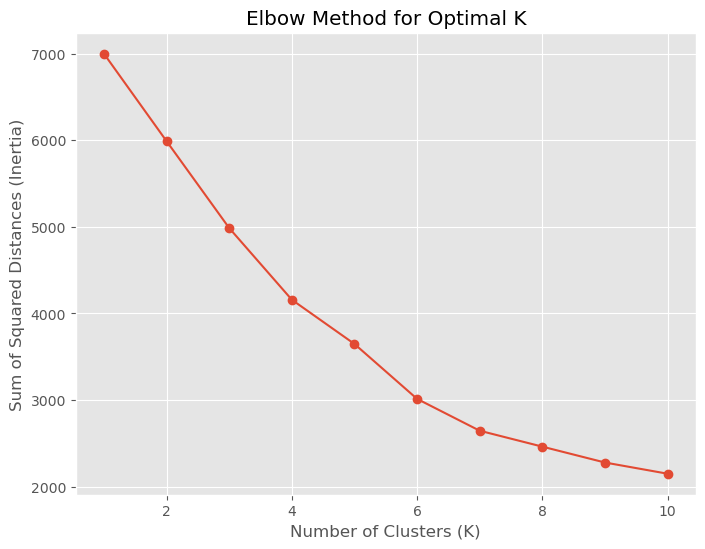

In [ ]:
# Run k-means clustering for a range of k values
inertia = []
for k in range(1, 11):  # You can adjust the range based on your specific needs
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(P_scaled)
    inertia.append(kmeans.inertia_)

# Plot the elbow graph
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Distances (Inertia)')
plt.grid(True)
plt.show()

In [ ]:
#choose k = 4
model = cluster.KMeans(n_clusters = 4, random_state = 10, n_init=10)

#fit the created k-means model to our data
model.fit(P_scaled)

P_scaled['cluster'] = model.labels_
P_scaled

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence,cluster
80000,1.436609,-0.031639,-0.460921,2.632821,-0.150780,0.003469,-0.746013,1
80001,1.143762,-0.031639,-0.861426,-0.898967,-0.150780,-0.118397,-1.299842,1
80002,1.338993,-0.031639,0.481006,-1.316436,-0.150473,-1.200053,0.418937,0
80003,1.143762,-0.031639,-0.512839,-0.819103,-0.150780,0.584679,-1.013379,1
80004,1.143762,-0.031639,1.704770,0.094570,-0.150780,0.843916,1.168515,0
...,...,...,...,...,...,...,...,...
80995,-0.320472,-0.031639,0.948261,0.209177,9.686221,-1.557000,-0.450002,3
80996,-0.418088,-0.031639,-0.127168,-1.215176,-0.150780,1.863557,-0.650526,1
80997,-0.418088,-0.031639,0.770259,1.432880,-0.149736,0.584319,1.096899,0
80998,-0.418088,-0.031639,0.666425,0.026463,-0.150780,0.726015,0.418937,0


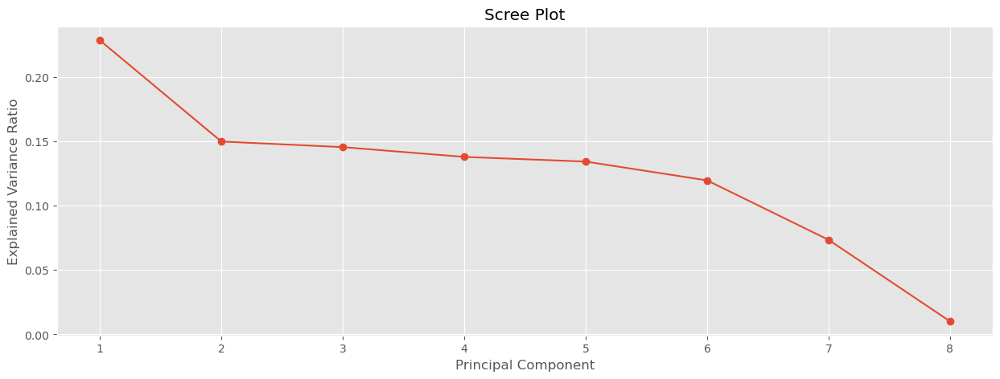

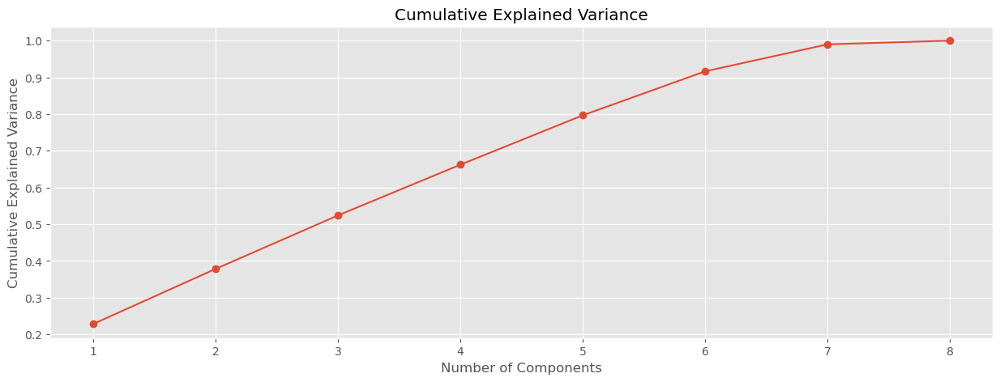

In [ ]:
#choosing PCA component
pca = PCA()
pca.fit(P_scaled)
explained_variance_ratio = pca.explained_variance_ratio_

#scree plot
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.grid(True)
plt.show()

#culmulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

In [ ]:
# Generating the cluster summary
cluster_summary = cluster_table(P_scaled, 'cluster')

# Printing the summary table
print(cluster_summary)

         Count  popularity  explicit  danceability  tempo  instrumentalness  \
cluster                                                                       
0          508        0.07     -0.03          0.71   0.03             -0.15   
1          481        0.07     -0.03         -0.59  -0.26             -0.15   
2            1        1.14     31.61          0.31   1.30             -0.15   
3           10       -0.17     -0.03          0.16  -0.31              9.17   

         loudness  valence  
cluster                     
0            0.25     0.73  
1           -0.03    -0.80  
2            1.04     0.05  
3           -0.66     0.25  


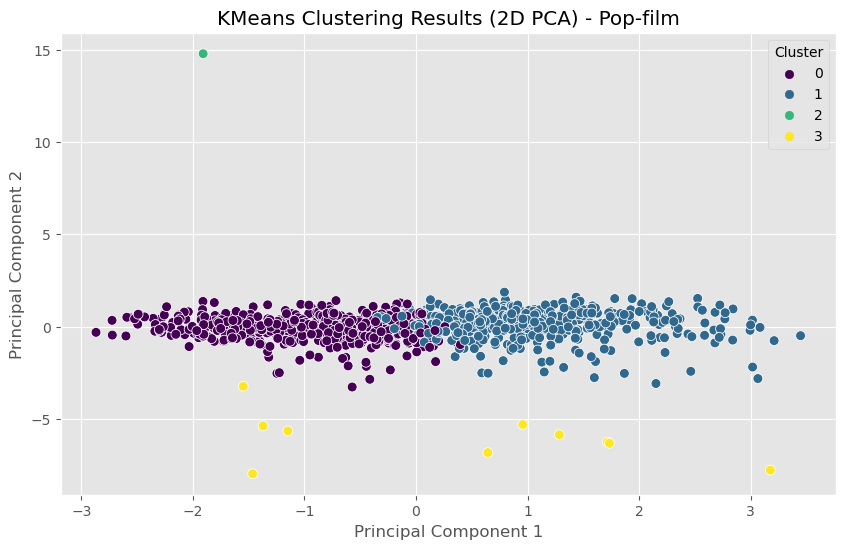

In [ ]:
#pca = 2
pca = PCA(n_components = 2) # 2D graph for easy interpretation
P_pca = pca.fit_transform(P_scaled.drop('cluster', axis=1))

# Create a scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=P_pca[:, 0], y=P_pca[:, 1], hue=P_scaled['cluster'], palette='viridis', s=50)
plt.title('KMeans Clustering Results (2D PCA) - Pop-film')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

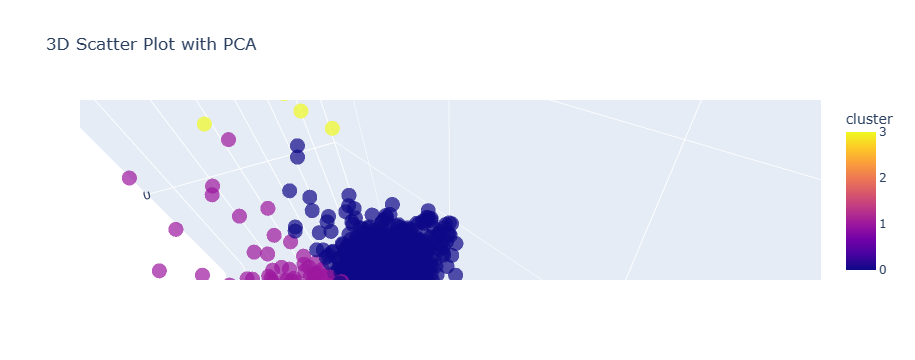

In [ ]:
# pca = 3
pca = PCA(n_components = 3)
P_pca = pca.fit_transform(P_scaled.drop('cluster', axis=1))
pca_df = pd.DataFrame(data = P_pca, columns = ['PC1', 'PC2', 'PC3'])
pca_df['cluster'] = P_scaled['cluster'].reset_index(drop=True)

# Create a 3D scatter plot using Plotly Express
fig = px.scatter_3d(
    pca_df, x='PC1', y='PC2', z='PC3',
    color='cluster',
    #symbol='cluster',
    opacity=0.7,
    title='3D Scatter Plot with PCA'
)

# Show the plot
fig.show()

## K-pop

In [ ]:
K = kpop
scaler = StandardScaler().fit(K)
K_scaled = pd.DataFrame(scaler.fit_transform(K),columns=K.columns,index=K.index)

K_scaled

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence
65000,0.950467,-0.22723,-0.632570,0.138207,-0.136086,-0.784563,-0.695890
65001,1.245400,-0.22723,1.316379,0.765860,-0.139307,-1.257615,-0.769776
65002,1.540334,-0.22723,0.666730,-0.884772,-0.139893,0.420914,0.904981
65003,0.950467,-0.22723,0.770083,-0.884479,-0.139893,0.444962,-0.828885
65004,1.363374,-0.22723,-0.019832,0.028977,-0.139893,0.583751,1.215303
...,...,...,...,...,...,...,...
65995,-0.760149,-0.22723,-0.189627,0.355311,-0.139893,-0.436215,0.831094
65996,-0.878122,-0.22723,1.168732,-0.590423,-0.139893,0.613639,0.904981
65997,0.242626,-0.22723,0.408346,0.762155,-0.139893,1.024167,-0.631855
65998,-0.819135,-0.22723,-0.064126,1.501495,0.603049,-0.417320,-1.001287


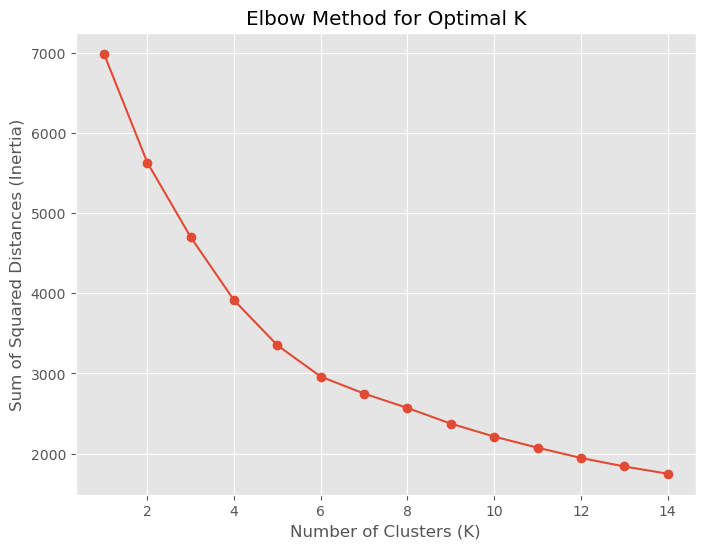

In [ ]:
# Run k-means clustering for a range of k values
inertia = []
for k in range(1, 15):  # You can adjust the range based on your specific needs
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(K_scaled)
    inertia.append(kmeans.inertia_)

# Plot the elbow graph
plt.figure(figsize=(8, 6))
plt.plot(range(1, 15), inertia, marker='o')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Distances (Inertia)')
plt.grid(True)
plt.show()

In [ ]:
model = cluster.KMeans(n_clusters = 6, random_state = 10, n_init=10)

#fit the created k-means model to our data
model.fit(K_scaled)

K_scaled['cluster'] = model.labels_
K_scaled

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence,cluster
65000,0.950467,-0.22723,-0.632570,0.138207,-0.136086,-0.784563,-0.695890,0
65001,1.245400,-0.22723,1.316379,0.765860,-0.139307,-1.257615,-0.769776,2
65002,1.540334,-0.22723,0.666730,-0.884772,-0.139893,0.420914,0.904981,2
65003,0.950467,-0.22723,0.770083,-0.884479,-0.139893,0.444962,-0.828885,2
65004,1.363374,-0.22723,-0.019832,0.028977,-0.139893,0.583751,1.215303,2
...,...,...,...,...,...,...,...,...
65995,-0.760149,-0.22723,-0.189627,0.355311,-0.139893,-0.436215,0.831094,1
65996,-0.878122,-0.22723,1.168732,-0.590423,-0.139893,0.613639,0.904981,2
65997,0.242626,-0.22723,0.408346,0.762155,-0.139893,1.024167,-0.631855,2
65998,-0.819135,-0.22723,-0.064126,1.501495,0.603049,-0.417320,-1.001287,3


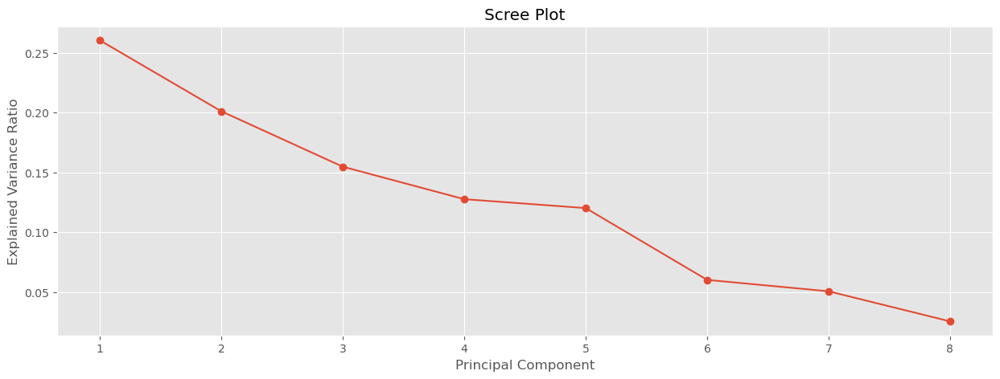

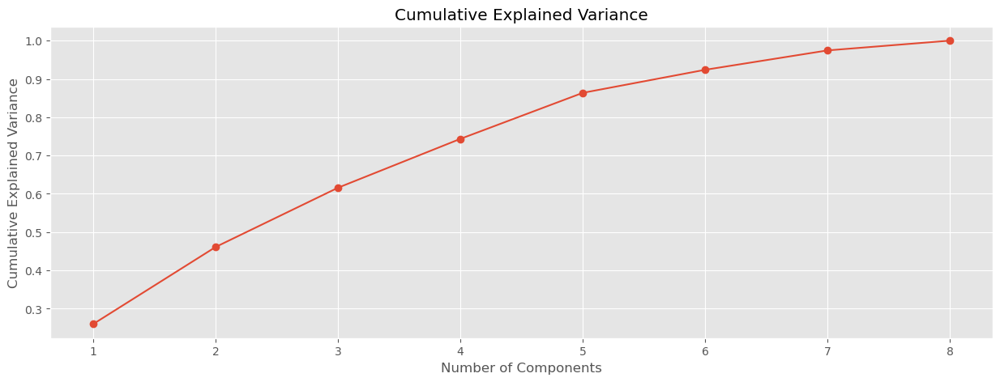

In [ ]:
#choosing PCA component
pca = PCA()
pca.fit(K_scaled)
explained_variance_ratio = pca.explained_variance_ratio_

#scree plot
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.grid(True)
plt.show()

#culmulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

In [ ]:
# Generating the cluster summary
cluster_summary = cluster_table(K_scaled, 'cluster')

# Printing the summary table
print(cluster_summary)

         Count  popularity  explicit  danceability  tempo  instrumentalness  \
cluster                                                                       
0          180        0.07     -0.23         -0.65  -0.83             -0.14   
1          230       -0.52     -0.23          0.03  -0.24             -0.14   
2          339        0.66     -0.23          0.66  -0.19             -0.14   
3          189        0.36     -0.23         -0.60   1.37             -0.14   
4           49       -3.36      4.40          1.89  -0.45             -0.14   
5           11       -0.05     -0.23          0.11  -0.53              7.18   

         loudness  valence  
cluster                     
0           -0.15    -1.06  
1           -1.04     0.71  
2            0.77     0.46  
3            0.39    -0.33  
4            0.11    -1.14  
5           -0.76    -0.55  


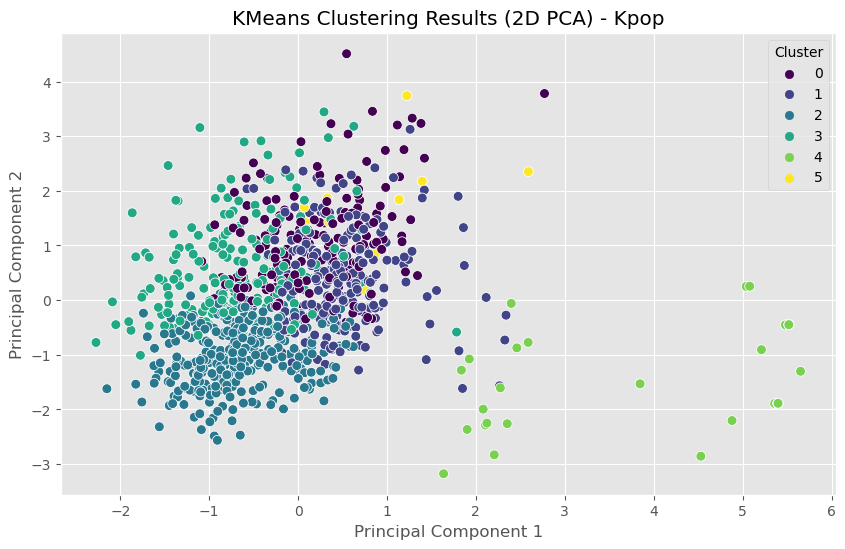

In [ ]:
#pca = 2
pca = PCA(n_components = 2) # 2D graph for easy interpretation
K_pca = pca.fit_transform(K_scaled.drop('cluster', axis=1))

# Create a scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=K_pca[:, 0], y=K_pca[:, 1], hue=K_scaled['cluster'], palette='viridis', s=50)
plt.title('KMeans Clustering Results (2D PCA) - Kpop')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

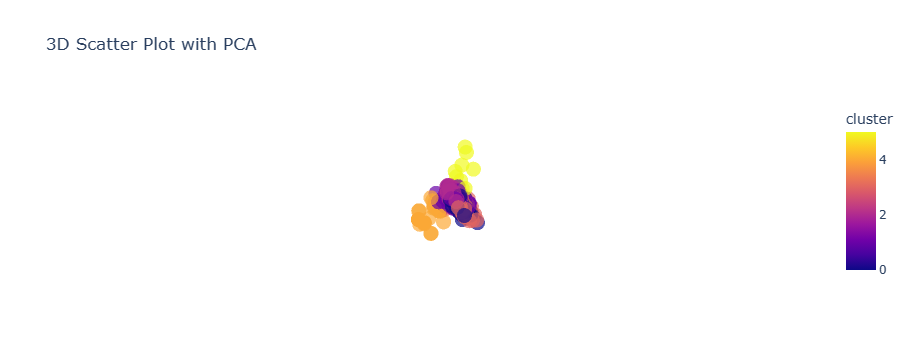

In [ ]:
# pca = 3
pca = PCA(n_components = 3)
K_pca = pca.fit_transform(K_scaled.drop('cluster', axis=1))
pca_df = pd.DataFrame(data = K_pca, columns = ['PC1', 'PC2', 'PC3'])
pca_df['cluster'] = K_scaled['cluster'].reset_index(drop=True)

# Create a 3D scatter plot using Plotly Express
fig = px.scatter_3d(
    pca_df, x='PC1', y='PC2', z='PC3',
    color='cluster',
    #symbol='cluster',
    opacity=0.7,
    title='3D Scatter Plot with PCA'
)

# Show the plot
fig.show()

## Hiphop

In [ ]:
H = hiphop
scaler = StandardScaler().fit(H)
H_scaled = pd.DataFrame(scaler.fit_transform(H),columns=H.columns,index=H.index)

H_scaled

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence
51000,1.390550,-0.684419,1.039890,-0.060799,2.152462,-0.260279,1.782698
51001,1.390550,-0.684419,0.267399,0.689998,-0.154352,-1.455318,0.759571
51002,1.359813,-0.684419,-0.211209,2.160436,0.076329,-2.003085,0.546048
51003,1.206131,-0.684419,0.502505,-0.606173,-0.153991,-0.516429,-1.099852
51004,1.574969,1.461094,-1.218806,1.810030,-0.154352,0.245125,-0.325834
...,...,...,...,...,...,...,...
51995,-1.160579,-0.684419,0.695628,-0.741317,-0.142139,-0.357320,0.768467
51996,-1.129843,-0.684419,0.796388,-0.740500,-0.149837,-0.909028,1.191064
51997,-1.160579,-0.684419,0.796388,-0.740500,-0.149837,-0.909028,1.191064
51998,-1.160579,1.461094,-0.076863,1.470588,-0.154352,-0.690315,-0.098967


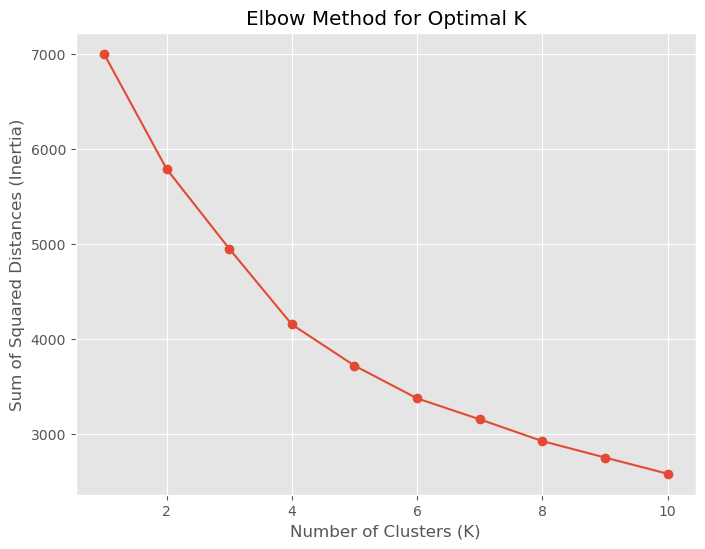

In [ ]:
# Run k-means clustering for a range of k values
inertia = []
for k in range(1, 11):  # You can adjust the range based on your specific needs
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(H_scaled)
    inertia.append(kmeans.inertia_)

# Plot the elbow graph
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Distances (Inertia)')
plt.grid(True)
plt.show()

In [ ]:
model = cluster.KMeans(n_clusters = 4, random_state = 10, n_init=10)

#fit the created k-means model to our data
model.fit(H_scaled)

H_scaled['cluster'] = model.labels_
H_scaled

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence,cluster
51000,1.390550,-0.684419,1.039890,-0.060799,2.152462,-0.260279,1.782698,3
51001,1.390550,-0.684419,0.267399,0.689998,-0.154352,-1.455318,0.759571,0
51002,1.359813,-0.684419,-0.211209,2.160436,0.076329,-2.003085,0.546048,0
51003,1.206131,-0.684419,0.502505,-0.606173,-0.153991,-0.516429,-1.099852,0
51004,1.574969,1.461094,-1.218806,1.810030,-0.154352,0.245125,-0.325834,0
...,...,...,...,...,...,...,...,...
51995,-1.160579,-0.684419,0.695628,-0.741317,-0.142139,-0.357320,0.768467,3
51996,-1.129843,-0.684419,0.796388,-0.740500,-0.149837,-0.909028,1.191064,3
51997,-1.160579,-0.684419,0.796388,-0.740500,-0.149837,-0.909028,1.191064,3
51998,-1.160579,1.461094,-0.076863,1.470588,-0.154352,-0.690315,-0.098967,1


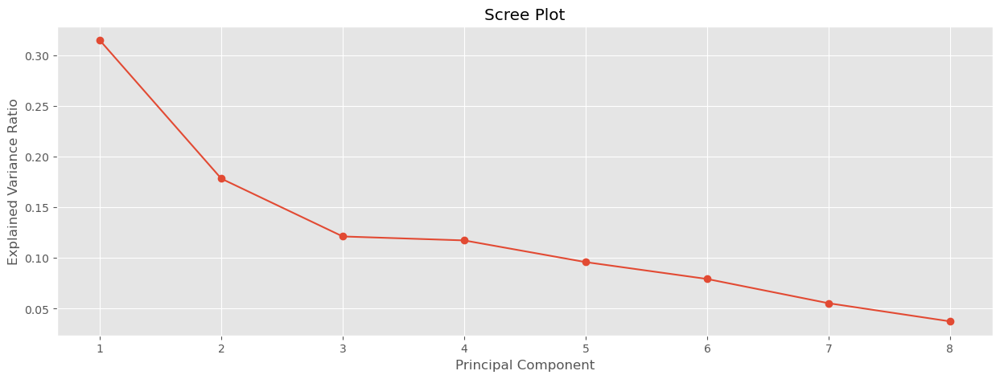

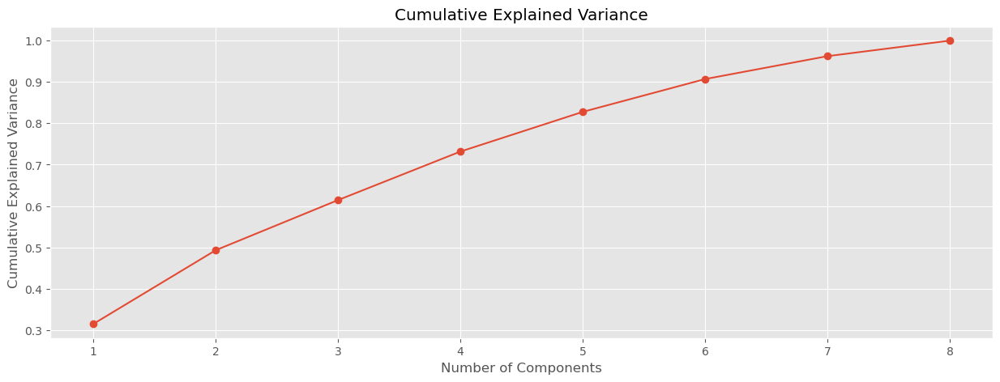

In [ ]:
#choosing PCA component
pca = PCA()
pca.fit(H_scaled)
explained_variance_ratio = pca.explained_variance_ratio_

#scree plot
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.grid(True)
plt.show()

#culmulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

In [ ]:
# Generating the cluster summary
cluster_summary = cluster_table(H_scaled, 'cluster')

# Printing the summary table
print(cluster_summary)

         Count  popularity  explicit  danceability  tempo  instrumentalness  \
cluster                                                                       
0          329        0.75     -0.68         -0.72  -0.30             -0.15   
1          290       -1.16      1.46          0.64  -0.27             -0.15   
2           10        0.70     -0.68         -0.76  -0.28              8.86   
3          371        0.59     -0.68          0.45  -0.40             -0.15   

         loudness  valence  
cluster                     
0           -0.37    -0.53  
1           -0.08    -0.37  
2            0.19    -0.35  
3            0.70     0.82  


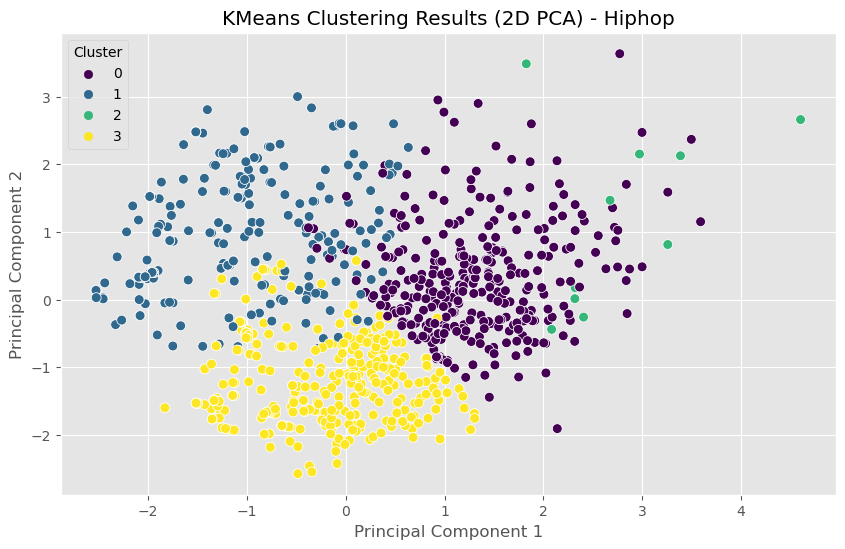

In [ ]:
#pca = 2
pca = PCA(n_components = 2) # 2D graph for easy interpretation
H_pca = pca.fit_transform(H_scaled.drop('cluster', axis=1))

# Create a scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=H_pca[:, 0], y=H_pca[:, 1], hue=H_scaled['cluster'], palette='viridis', s=50)
plt.title('KMeans Clustering Results (2D PCA) - Hiphop')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

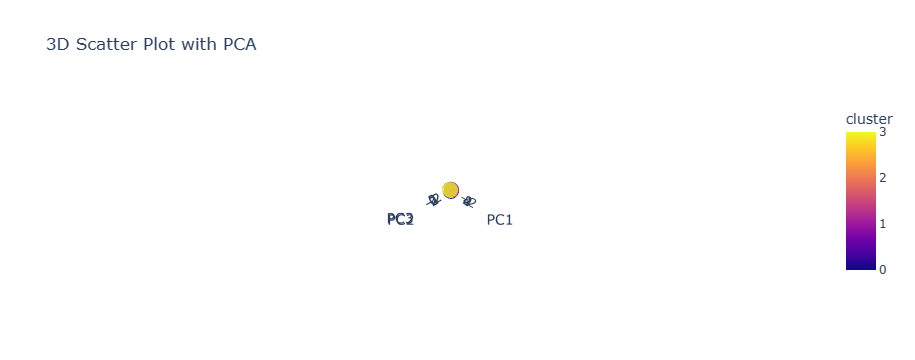

In [ ]:
# pca = 3
pca = PCA(n_components = 3)
H_pca = pca.fit_transform(H_scaled.drop('cluster', axis=1))
pca_df = pd.DataFrame(data = H_pca, columns = ['PC1', 'PC2', 'PC3'])
pca_df['cluster'] = H_scaled['cluster'].reset_index(drop=True)

# Create a 3D scatter plot using Plotly Express
fig = px.scatter_3d(
    pca_df, x='PC1', y='PC2', z='PC3',
    color='cluster',
    #symbol='cluster',
    opacity=0.7,
    title='3D Scatter Plot with PCA'
)

# Show the plot
fig.show()

## Chill

In [ ]:
C = chill
scaler = StandardScaler().fit(C)
C_scaled = pd.DataFrame(scaler.fit_transform(C),columns=C.columns,index=C.index)

C_scaled

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence
15000,1.434996,-0.452054,-1.601063,-0.238209,-0.549144,-0.168259,-0.893905
15001,1.367709,-0.452054,-0.471581,-1.414860,-0.328779,-0.546096,1.403553
15002,0.425682,-0.452054,-0.932594,-0.084888,0.848973,-1.823190,-1.256178
15003,0.963983,-0.452054,-0.878809,-1.162048,-0.545996,-1.976633,-1.693658
15004,1.434996,2.212124,-1.893037,0.832719,-0.549144,0.141273,-1.251593
...,...,...,...,...,...,...,...
15995,-1.458371,-0.452054,0.750102,0.914520,-0.549144,1.114366,2.554574
15996,-0.314482,2.212124,0.404343,-1.679719,0.333552,0.323097,-1.068163
15997,0.627545,2.212124,1.226482,0.776812,-0.549141,-0.385918,-0.018028
15998,0.291107,-0.452054,0.050900,0.431363,2.074254,-1.195466,-1.324964


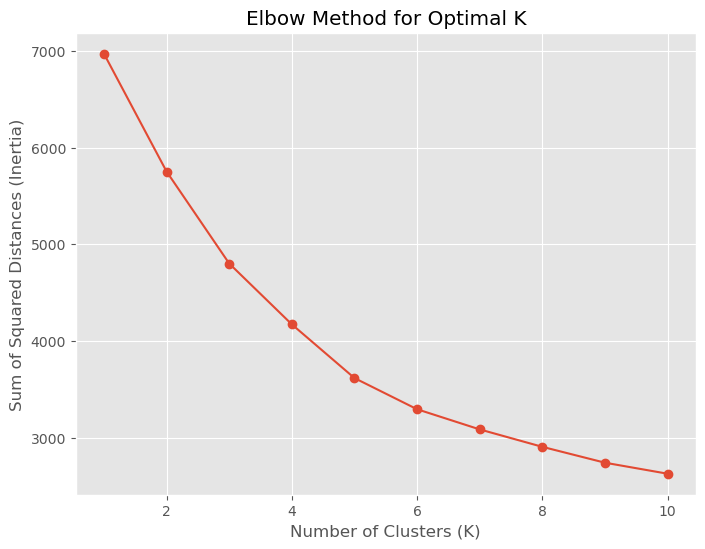

In [ ]:
# Run k-means clustering for a range of k values
inertia = []
for k in range(1, 11):  # You can adjust the range based on your specific needs
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(C_scaled)
    inertia.append(kmeans.inertia_)

# Plot the elbow graph
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Distances (Inertia)')
plt.grid(True)
plt.show()

In [ ]:
model = cluster.KMeans(n_clusters = 5, random_state = 10, n_init=10)

#fit the created k-means model to our data
model.fit(C_scaled)

C_scaled['cluster'] = model.labels_
C_scaled

,popularity,explicit,danceability,tempo,instrumentalness,loudness,valence,cluster
15000,1.434996,-0.452054,-1.601063,-0.238209,-0.549144,-0.168259,-0.893905,0
15001,1.367709,-0.452054,-0.471581,-1.414860,-0.328779,-0.546096,1.403553,4
15002,0.425682,-0.452054,-0.932594,-0.084888,0.848973,-1.823190,-1.256178,1
15003,0.963983,-0.452054,-0.878809,-1.162048,-0.545996,-1.976633,-1.693658,0
15004,1.434996,2.212124,-1.893037,0.832719,-0.549144,0.141273,-1.251593,2
...,...,...,...,...,...,...,...,...
15995,-1.458371,-0.452054,0.750102,0.914520,-0.549144,1.114366,2.554574,4
15996,-0.314482,2.212124,0.404343,-1.679719,0.333552,0.323097,-1.068163,2
15997,0.627545,2.212124,1.226482,0.776812,-0.549141,-0.385918,-0.018028,2
15998,0.291107,-0.452054,0.050900,0.431363,2.074254,-1.195466,-1.324964,1


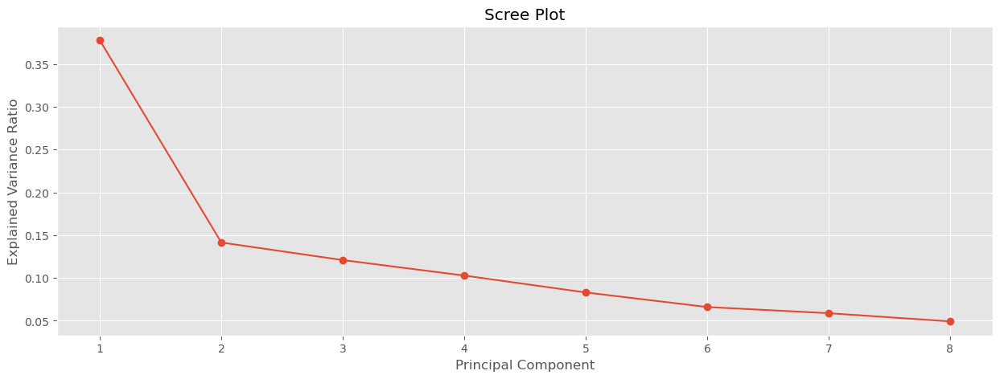

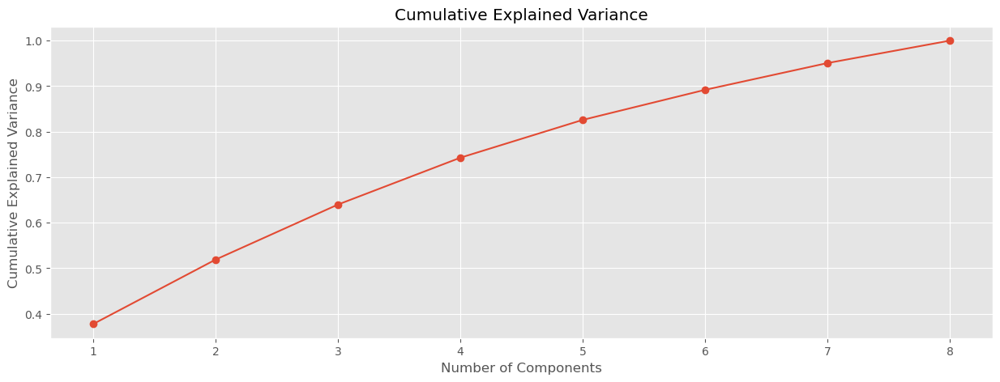

In [ ]:
#choosing PCA component
pca = PCA()
pca.fit(C_scaled)
explained_variance_ratio = pca.explained_variance_ratio_

#scree plot
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.grid(True)
plt.show()

#culmulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

In [ ]:
# Generating the cluster summary
cluster_summary = cluster_table(C_scaled, 'cluster')

# Printing the summary table
print(cluster_summary)

         Count  popularity  explicit  danceability  tempo  instrumentalness  \
cluster                                                                       
0          302        0.16     -0.45         -0.53  -0.02             -0.55   
1          184        0.16     -0.45          0.05  -0.19              2.07   
2          163        0.36      2.21          0.30   0.12             -0.55   
3           56       -3.61     -0.45          0.26  -0.33             -0.55   
4          291        0.29     -0.45          0.65  -0.02             -0.55   

         loudness  valence  
cluster                     
0            0.03    -0.62  
1           -0.94    -0.70  
2            0.27     0.04  
3            0.66     0.01  
4            0.55     0.81  


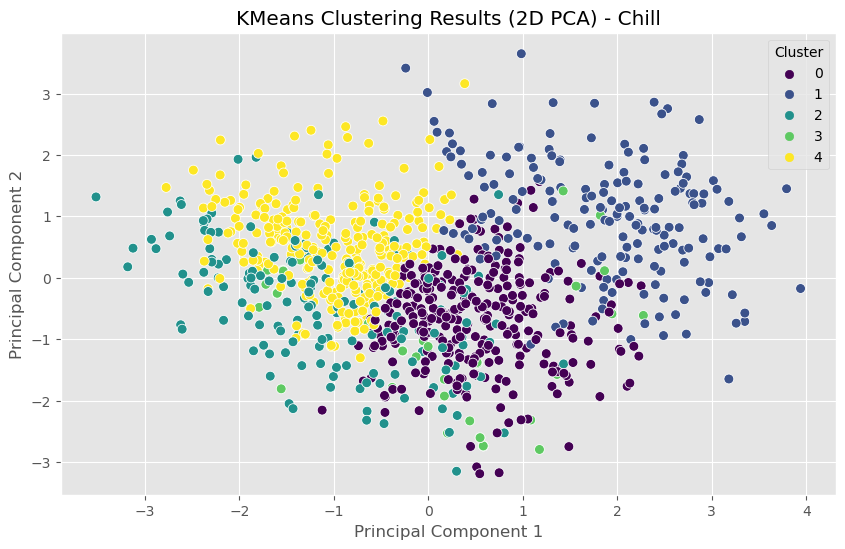

In [ ]:
#pca = 2
pca = PCA(n_components = 2) # 2D graph for easy interpretation
C_pca = pca.fit_transform(C_scaled.drop('cluster', axis=1))

# Create a scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=C_pca[:, 0], y=C_pca[:, 1], hue=C_scaled['cluster'], palette='viridis', s=50)
plt.title('KMeans Clustering Results (2D PCA) - Chill')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

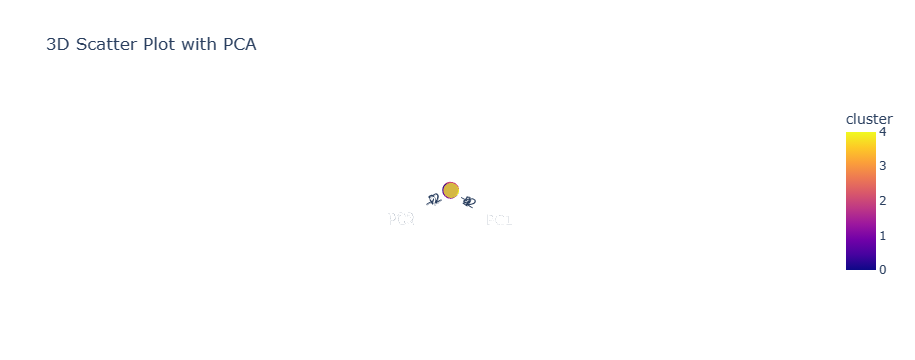

In [ ]:
# pca = 3
pca = PCA(n_components = 3)
C_pca = pca.fit_transform(C_scaled.drop('cluster', axis=1))
pca_df = pd.DataFrame(data = C_pca, columns = ['PC1', 'PC2', 'PC3'])
pca_df['cluster'] = C_scaled['cluster'].reset_index(drop=True)

# Create a 3D scatter plot using Plotly Express
fig = px.scatter_3d(
    pca_df, x='PC1', y='PC2', z='PC3',
    color='cluster',
    #symbol='cluster',
    opacity=0.7,
    title='3D Scatter Plot with PCA'
)

# Show the plot
fig.show()